**Текст, выделенный полужирным шрифтом**# ВКР

Объектом данной ВКР (выпускной квалификационная работа) является построение модели для прогнозирования конечных свойств новых композиционных материалов.
> Свойства композитов зависят в первую очередь от свойств исходных компонентов: армирующих элементов и матрицы. Кроме того их соединение дает эффект синергизма, связанный с появлением у композита свойств не характерных для исходных компонентов.

> В качестве исходных данных для построения модели имееются наборы числовых значений с физическими характеристиками армирующих элементов (предположительно ткани) и матрицы. В качестве выходных переменных указаны значения модуля упругости при растяжении и прочности при растяжении. Таким образом решение данной задачи должно быть выполнено с применением многоцелевых регрессионных моделей.



# Загрузка библиотек

In [2]:
# импортируем библиотеки общего применения
import pandas as pd # работа с таблицами
import numpy as np # работа с массивами
import sklearn # модели и подготовка данных
from sklearn.model_selection import train_test_split # подготовка выборок
from sklearn.pipeline import make_pipeline # програмный конвейер
import seaborn as sns # статистические графики
import matplotlib as mpl
import matplotlib.pyplot as plt # визуализация данных
%matplotlib inline
#!pip install xlrd xlwt openpyxl pyxlsb

# Загрузка исходных данных

# подключение гугл диска
from google.colab import drive
drive.mount('/content/drive')

In [3]:
# загрузка файла №1 из гугл диска
path_1 = '/content/drive/MyDrive/VKR/X_bp.xlsx'
rawdata_1 = pd.read_excel(path_1, index_col =0)
# загрузка файла №2 из гугл диска
path_2 = '/content/drive/MyDrive/VKR/X_nup.xlsx'
rawdata_2 = pd.read_excel(path_2, index_col =0)

In [4]:
print(rawdata_1.shape)
rawdata_1.head()

(1023, 10)


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0


In [ ]:
print(rawdata_2.shape)
rawdata_2.head()

(1040, 3)


,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0.0,0.0,4.0,57.0
1.0,0.0,4.0,60.0
2.0,0.0,4.0,70.0
3.0,0.0,5.0,47.0
4.0,0.0,5.0,57.0


Первая таблица содержит свойства исходных компонентов. Вторая таблица содержит, предположительно, характеристики плетения нитей армирующего компонента. Анализ размерности показал различное количество строк данных между таблицами. Нет других общих столбцов между таблицами кроме индексов строк. Поэтому соединение таблиц необходимо выполнить по индексам строк методом внутреннего соединения (INNER).

In [5]:
rawdata = rawdata_2.join(rawdata_1, how='inner')
rawdata.head()

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,0.0,4.0,57.0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0
1,0.0,4.0,60.0,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0
2,0.0,4.0,70.0,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0
3,0.0,5.0,47.0,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0
4,0.0,5.0,57.0,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0


In [6]:
# немного трансформируем таблицу для удобства работы
# переупорядочим столбцы
df = rawdata.copy()
Epoxy = df.pop('Потребление смолы, г/м2')
df.insert(8, 'Потребление смолы, г/м2', Epoxy)
# упростим названия столбцов
df.columns = ['Stripe_angle', 'Stripe_Step', 'Stripe_density', 'Matrix_ratio',
              'Density', 'M_Elasticity', 'Hardener_ratio', 'Epoxy_ratio', 'Epoxy_Consumption', 'Flash_point',
              'Surface_density', 'Tension_Elasticity', 'Tension_Rigidity']
df.tail()

,Stripe_angle,Stripe_Step,Stripe_density,Matrix_ratio,Density,M_Elasticity,Hardener_ratio,Epoxy_ratio,Epoxy_Consumption,Flash_point,Surface_density,Tension_Elasticity,Tension_Rigidity
1018,90.0,9.076380,47.019770,2.271346,1952.087902,912.855545,86.992183,20.123249,125.007669,324.774576,209.198700,73.090961,2387.292495
1019,90.0,10.565614,53.750790,3.444022,2050.089171,444.732634,145.981978,19.599769,117.730099,254.215401,350.660830,72.920827,2360.392784
1020,90.0,4.161154,67.629684,3.280604,1972.372865,416.836524,110.533477,23.957502,236.606764,248.423047,740.142791,74.734344,2662.906040
1021,90.0,6.313201,58.261074,3.705351,2066.799773,741.475517,141.397963,19.246945,197.126067,275.779840,641.468152,74.042708,2071.715856
1022,90.0,6.078902,77.434468,3.808020,1890.413468,417.316232,129.183416,27.474763,194.754342,300.952708,758.747882,74.309704,2856.328932


# Разведочный анализ данных

## Проверка пропусков и задублированных строк

In [7]:
# Проверим пропуски
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Stripe_angle        1023 non-null   float64
 1   Stripe_Step         1023 non-null   float64
 2   Stripe_density      1023 non-null   float64
 3   Matrix_ratio        1023 non-null   float64
 4   Density             1023 non-null   float64
 5   M_Elasticity        1023 non-null   float64
 6   Hardener_ratio      1023 non-null   float64
 7   Epoxy_ratio         1023 non-null   float64
 8   Epoxy_Consumption   1023 non-null   float64
 9   Flash_point         1023 non-null   float64
 10  Surface_density     1023 non-null   float64
 11  Tension_Elasticity  1023 non-null   float64
 12  Tension_Rigidity    1023 non-null   float64
dtypes: float64(13)
memory usage: 111.9 KB


In [8]:
# Проверим и удалим задублированные строки
print('кол-во задублированных строк: ', df.duplicated().sum())
df = df.drop_duplicates()

кол-во задублированных строк:  0


## Описательная статистика

In [9]:
# посмотрим описательную статистику
df.describe().round(1).T

,count,mean,std,min,25%,50%,75%,max
Stripe_angle,1023.0,44.3,45.0,0.0,0.0,0.0,90.0,90.0
Stripe_Step,1023.0,6.9,2.6,0.0,5.1,6.9,8.6,14.4
Stripe_density,1023.0,57.2,12.4,0.0,49.8,57.3,64.9,104.0
Matrix_ratio,1023.0,2.9,0.9,0.4,2.3,2.9,3.6,5.6
Density,1023.0,1975.7,73.7,1731.8,1924.2,1977.6,2021.4,2207.8
M_Elasticity,1023.0,739.9,330.2,2.4,500.0,739.7,961.8,1911.5
Hardener_ratio,1023.0,110.6,28.3,17.7,92.4,110.6,129.7,199.0
Epoxy_ratio,1023.0,22.2,2.4,14.3,20.6,22.2,24.0,33.0
Epoxy_Consumption,1023.0,218.4,59.7,33.8,179.6,219.2,257.5,414.6
Flash_point,1023.0,285.9,40.9,100.0,259.1,285.9,313.0,413.3


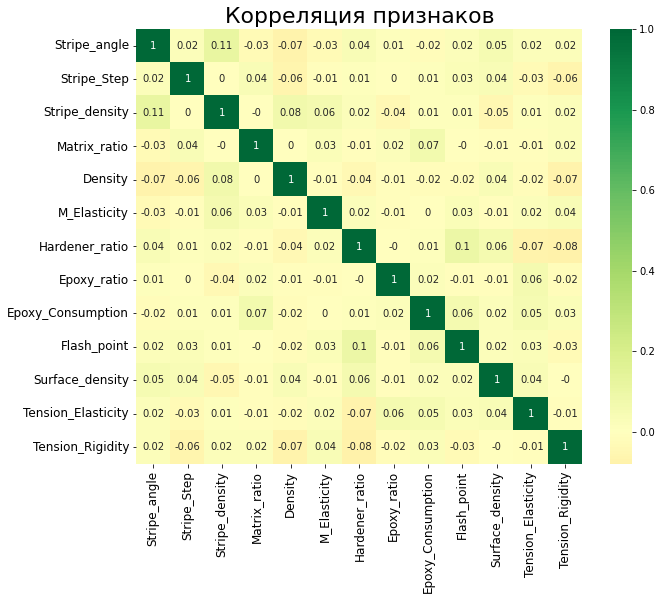

In [10]:
# Проверим корреляцию признаков
plt.figure(figsize=(10,8))
sns.heatmap(df.corr().round(2), xticklabels=df.corr().columns, yticklabels=df.corr().columns, cmap='RdYlGn', center=0, annot=True)
plt.title('Корреляция признаков', fontsize=22)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

Корреляция признаков между собой отсутствует. Корреляция признаков с целевой функцией тоже отсутствует, что отрицательно скажется на задаче построения регрессии, которая подразумевает связь признаков и целевых функций.

Проверка данных показывает:
1.   Пропусков нет.
2.   Задублированных строк нет.
3.   Значимой корреляции между признаками нет
3.   Присутствуют аномальные значения. Например, не могут быть нулевые значения для:  Stripe_Step, Stripe_density.
4.   Наличие зачительных выбросов в обе стороны
    *  значительно ниже 25% квартиля для: Matrix_ratio, M_Elasticity, Hardener_ratio, Epoxy_Consumption, Flash_point, Surface_density
    *  значителльно выше 75% квартиля для: M_Elasticity, Surface_density.
    
Обозначим выбросы методами BoxPlot (ящик с усами), Кластеризацией DBSCAN и с помощью алгоритма IsolationForest (случайный лес).




Перед очисткой данных сравним методы BoxPlot (ящик с усами), Кластеризацию DBSCAN и алгоритм IsolationForest (случайный лес).

## Анализ выбросов

### Одномерный анализ выбросов методом BoxPlot

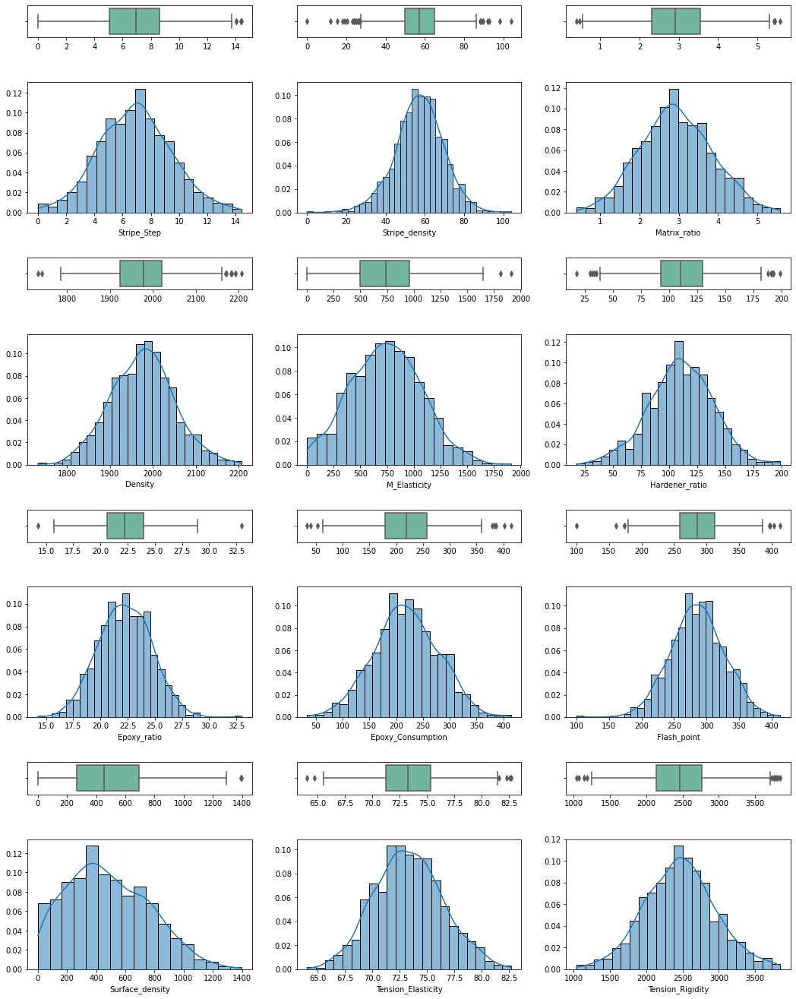

In [5]:
data = df.iloc[:,1:13]
names = df.columns # признаки для отрисовки в ящиках

spec = mpl.gridspec.GridSpec(
    ncols=3, nrows=20, height_ratios=[1, 4] * 10, hspace=0.55)

fig=plt.figure(figsize=(18, 60))
ax_1 = 3 # ввод кол-ва графиков для отображения по горизонтали
if len(names) % ax_1 ==0 : ax_0 = len(names)//ax_1
else: ax_0 = len(names)// ax_1 + 1
count = 1
for i in range(ax_0):
    for j in range(ax_1):
      if count<=len(data.columns):
        ax = fig.add_subplot(spec[6*i+j])
        sns.boxplot(data=data,
                    x=data.columns[3*i+j],
                    palette='Set2',
                    ax=ax).set(xlabel=None)
        
        ax = fig.add_subplot(spec[6*i+j+3])
        sns.histplot(x=data.columns[3*i+j],
                     kde=True, ax=ax,
                     data=data, stat='probability',
                    palette='Set2').set(ylabel=None)
        count +=1
plt.show()

Кол-во выбросов подсчитанных по методу QUARTILE:  76


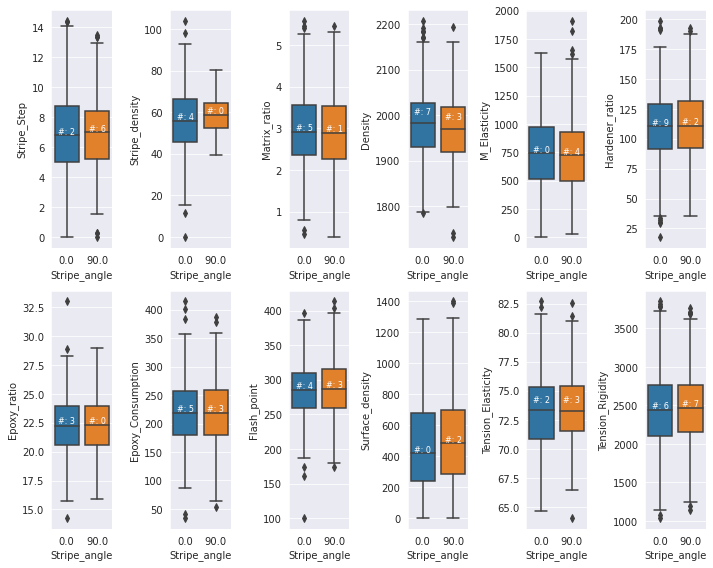

In [11]:
# Посчитаем выбросы методом boxplot_stats
# пометим выбросы определенные методом Quantile
import matplotlib.cbook
import itertools

group_col = 'Stripe_angle' # признак для группировки
names = df.columns.drop(group_col) # признаки для отрисовки в ящиках
sns.set_style("darkgrid")
ax_1 = 6 # ввод кол-ва графиков для отображения по горизонтали
if len(names) % ax_1 ==0 : ax_0 = len(names)//ax_1
else: ax_0 = len(names)// ax_1 + 1

# откроем колонку для меток ввыбросов в начальном наборе данных
df['outliers_qrtl'] = np.nan
df['outliers_qrtl'].fillna(0, inplace = True)


fig, axes = plt.subplots(ax_0, ax_1, figsize=(10,8))
for name, ax in zip(names, axes.flatten()):
    # отрисуем боксплот (sns красивее)
    boxplot = sns.boxplot(y=name, x=group_col, data=df, orient='v', ax=ax)
   
    # посчитаем кол-во выбросов используя свойства Boxplot
    obs = [matplotlib.cbook.boxplot_stats(df)[0]['fliers'] for names, df in df.groupby(group_col)[name]]
    n_obs = [len(obs[i]) for i, j in enumerate(obs)]
    # пометим метку для выбросов
    df['outliers_qrtl'].where(~(df[name].isin(list(itertools.chain(*obs)))), other=-1, inplace = True)
    # впишем кол-во выбросов в этикетку на графике
    medians_dict = {grp[0]:grp[1][name].median() for grp in df.groupby(group_col)}
    xticklabels = [x.get_text() for x in boxplot.get_xticklabels()]
    for (x, xticklabel), n_ob in zip(enumerate(xticklabels), n_obs):
      boxplot.text(x, medians_dict[float(xticklabel)]*1.01, "#: "+str(n_ob), horizontalalignment='center', fontdict={'size':8}, color='white')
plt.tight_layout()
print('Кол-во выбросов подсчитанных по методу QUARTILE: ', (df['outliers_qrtl']==-1).sum())

### Многомерный анализ выбросов

In [12]:
# Импорт специальных библиотек
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
from scipy.interpolate import splrep, splev
from sklearn.preprocessing import StandardScaler
from random import seed
seed(1)

#### Кластеризация DBSCAN

Для многомерных анализов выбросов используют методы кластеризации, которые определяют как выбросы точки данных которые удаленны от основных класттеров.

> Одним из распространенных методов кластеризации, показывающем хороший результат является алгоритм DBSCAN. Для корректной работы алгоритма DBSCAN нужно подобрать значение epsilon и minPoints, а затем обучить модель.

Для подбора эпсилона используем график K-расстояний – дистанций между точкой и ближайшей к ней точкой данных для всех точек в наборе:

In [13]:
# датасет для анализа
df_analize = df.iloc[:,:13]
col = df_analize.columns.to_list # колонки с переменными для анализа
#df_analize.head()

col = df_analize.columns
data = StandardScaler().fit_transform(df_analize)
df_an_std = pd.DataFrame(data=data, columns=col)
df_an_std.head()

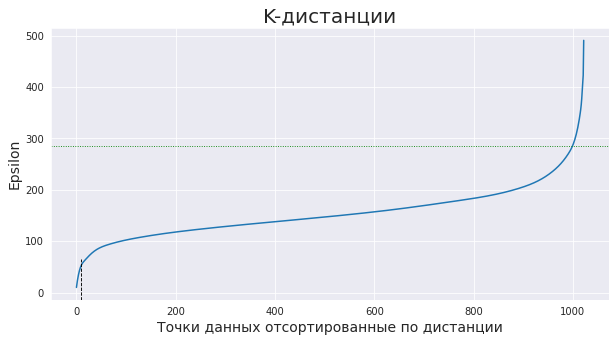

Оптимальный min_samples : 10
Оптимальный Epsilon : 284.5


In [14]:
# расчет расстояний между точками по алгоритму Ближайших соседей
neigh = NearestNeighbors(n_neighbors = 2)
nbrs = neigh.fit(df_analize)
distances, indices = nbrs.kneighbors(df_analize)
distances = np.sort(distances, axis = 0) # # сортировка по возрастанию
n = list(range(1,len(distances)+1))
# сглаживание кривой сплайном
spline = splrep(n, distances[:, 1], k=3, s=(1200))
#X_ = np.linspace(1, len(distances), num=len(distances)).ravel()
Y_ = splev(n, spline, der=0)

# расчит кривизны кривой
dx = np.gradient(n, n)  # первая производная
dy = np.gradient(Y_, n)
d2x = np.gradient(dx, n)  # вторая производная
d2y = np.gradient(dy, n)
cur = np.abs(d2y) / (np.sqrt(1 + dy ** 2)) ** 1.5  # кривизна
# мин.кол-во точек для кластеризации
min_smpl = cur[:100].argmax()
# оптимальное Эпсилон для DBSCAN в точке максимальной кривизны
Epsilon = Y_[cur[100:1000].argmax()+100]
# График
plt.figure(figsize = (10, 5))
plt.plot(Y_)
plt.axvline(x=min_smpl, ymax=0.15, linestyle= "--", lw=0.9, c='k')
plt.axhline(y=Epsilon, linestyle= ":", lw=0.9, c='g')
plt.title('K-дистанции', fontsize = 20)
plt.xlabel('Точки данных отсортированные по дистанции', fontsize = 14)
plt.ylabel('Epsilon', fontsize = 14)
plt.show()
print('Оптимальный min_samples :', min_smpl)
print(f'Оптимальный Epsilon : %.1f' % Epsilon)

Оптимальные значения лежат в точках максимальной кривизны. Как видно на графике оптимальное значение "Эпсилон" лежит в пределах 200-300. Подобранные параметры применим для расчета алгоритма DBSCAN.

In [15]:
# многомерный анализ выбросов DBSCAN
outlier_detection = DBSCAN(min_samples = 6, eps =200 )
df['outliers_DBSCAN'] = outlier_detection.fit_predict(df_analize)
print('Кол-во выбросов подсчитанных по методу кластеризации DBSCAN: ', (df['outliers_DBSCAN']==-1).sum())
print('Всего классов: \n', df['outliers_DBSCAN'].value_counts())

Кол-во выбросов подсчитанных по методу кластеризации DBSCAN:  339
Всего классов: 
  0    674
-1    339
 2      6
 1      4
Name: outliers_DBSCAN, dtype: int64


#### Метод IsolationForest

In [16]:
from sklearn.ensemble import IsolationForest
import numpy as np
np.random.seed(1)

clf = IsolationForest(random_state = 1, contamination= 'auto')
df['outliers_clf'] = clf.fit_predict(df)
print('Кол-во выбросов подсчитанных по методу IsolationForest: ', (df['outliers_clf']==-1).sum())
print('Всего классов: \n', df['outliers_clf'].value_counts())

Кол-во выбросов подсчитанных по методу IsolationForest:  124
Всего классов: 
  1    899
-1    124
Name: outliers_clf, dtype: int64


### Сравнение и выбор фильтра для выбросов

Для сравнения будем использовать полиноминальную регрессионную модель. Для метрики качества используем показатель R^2 (Коэффициент детерминации) и RMSE (корень из средней квадратичной ошибки).

In [17]:
# импортируем библиотеки для работы с регрессией
import time
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LassoCV
import warnings
#warnings.filterwarnings('ignore')

#### Подбор параметров регрессии для сравнительного анализа

Альфа Tension_Elasticity: 0.21
Альфа Tension_Rigidity: 15.84


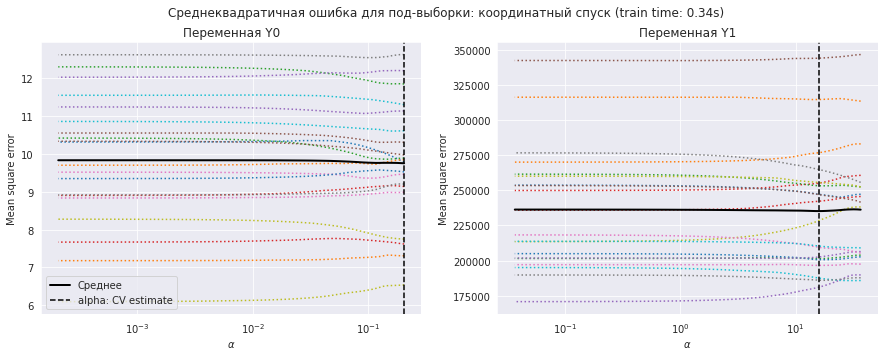

In [18]:
#Выбор коэф. АЛЬФА для Регрессии Лассо с помощью перекрестной проверки

Y_n = ['Tension_Elasticity', 'Tension_Rigidity'] # обозначим целевые переменные
data = df.iloc[:,:11] # выделим признаки
lasso_nalpha = []

fig, ax = plt.subplots(1,2, figsize=(15,5))
for i, Y in enumerate(Y_n):
  target_func = df[Y] # выделим целевые переменные

  start_time = time.time()
  model = make_pipeline(StandardScaler(), LassoCV(cv=20)).fit(data, target_func)
  fit_time = time.time() - start_time

  # отрисуем вычисление Альфа параметра
  #ymin, ymax = 2300, 3800
  lasso = model[-1]
  ax[i].set_title(f'Переменная Y{i}')
  ax[i].semilogx(lasso.alphas_, lasso.mse_path_, linestyle=":")
  ax[i].plot(
      lasso.alphas_,
      lasso.mse_path_.mean(axis=-1),
      color="black",
      label="Среднее",
      linewidth=2,
  )
  ax[i].axvline(lasso.alpha_, linestyle="--", color="black", label="alpha: CV estimate")
  ax[i].set_xlabel(r"$\alpha$")
  ax[i].set_ylabel("Mean square error")
  ax[0].legend()
  fig.suptitle(
      f"Среднеквадратичная ошибка для под-выборки: координатный спуск (train time: {fit_time:.2f}s)"
  )
  #plt.ylim(ymin, ymax)
  print(f'Альфа {Y}: {lasso.alpha_:.2f}')
  lasso_nalpha.append(int(-1 * lasso.alpha_ // 1 * -1))

In [19]:
# Настроим параметры полиноминальной регрессии. Определим ее степень.

lasso_eps = 0.001 # шаг
lasso_iter=10000 #макс кол-во циклов

Y_n = ['Tension_Elasticity', 'Tension_Rigidity'] # обозначим целевые переменные
data = df.iloc[:,:11] # выделим признаки
# подготовим таблицу для вывода результатов
res_degree = pd.DataFrame({'Y_function':[], 'polinom_degree':[], 'Score_r2':[], 'RMSE':[]})

for Y, A in zip(Y_n, lasso_nalpha):
  target_func = df[Y].values
  X_train, X_test, y_train, y_test = train_test_split(data, target_func,test_size=0.2)
  degree = 1 # начальная степень полинома
  test_score = 0
  while test_score <1 and test_score >=0 and degree<10:
    # соберем "конвейер" с полиноминальной трансформацией и LASSO регрессией с кросс-валидацией
    model_lasso = make_pipeline(StandardScaler(with_mean=True), 
                          PolynomialFeatures(degree, interaction_only=False), 
                          LassoCV(eps=lasso_eps, n_alphas=A, max_iter=lasso_iter, cv=5)) 
    model_lasso.fit(X_train,y_train) 
    test_pred = np.array(model_lasso.predict(X_test))
    RMSE=np.sqrt(np.sum(np.square(test_pred-y_test))) 
    test_score = model_lasso.score(X_test,y_test)
    # запишем полученные значения
    res_degree.loc[len(res_degree)] = [Y,degree,test_score,RMSE]
    degree += 1
# оптимальная степень полинома   
degree_opt = int(res_degree['polinom_degree'][res_degree['Score_r2'].idxmax()])
print('оптимальная степень полиноминальной регрессии: ', degree_opt)
res_degree

оптимальная степень полиноминальной регрессии:  1


,Y_function,polinom_degree,Score_r2,RMSE
0,Tension_Elasticity,1.0,-0.010736,43.752859
1,Tension_Rigidity,1.0,-0.028743,7374.629904


По результату подбра опеределена оптимальная степень полинома. Следующим шагом проверим какой метод отсечения выбросов дает наилучший результат, чтобы в дальнейшем тестировать различные модели регресси на очищенном наборе данных. В качестве инструмента оценки используем полученную полиноминальную регрессию с метрикой коэффициента детерминации.

#### Сравнение эффективности фильтров выбросов

In [20]:
Y_n = ['Tension_Elasticity', 'Tension_Rigidity']
outl_filtres = ['outliers_qrtl', 'outliers_DBSCAN', 'outliers_clf']
# таблица для вывода результатов
res_outl = pd.DataFrame({'Y_function':[], 'filtr_for_outliers':[], 'len_data':[], 'R^2 score':[]})
for Y, A in zip(Y_n, lasso_nalpha):
  for filtr in outl_filtres:
    # готовим выборку
    target_func = df[Y][df[filtr] !=-1].values
    data = df.iloc[:,:11][df[filtr] !=-1]
    X_train, X_test, y_train, y_test = train_test_split(data, target_func, test_size=0.2)
    model_lasso = make_pipeline(StandardScaler(with_mean=True), 
                          PolynomialFeatures(degree_opt, interaction_only=True), 
                          LassoCV(n_alphas=A, max_iter=lasso_iter, cv=10))
    model.fit(X_train,y_train)
    test_score = model.score(X_test,y_test)
    # запишем
    res_outl.loc[len(res_outl)] = [Y,filtr,len(target_func), test_score]
filtr_opt = res_outl['filtr_for_outliers'][res_outl['R^2 score'].idxmax()]
print('оптимальный фильтр для выбросов: ', filtr_opt)
res_outl

оптимальный фильтр для выбросов:  outliers_DBSCAN


,Y_function,filtr_for_outliers,len_data,R^2 score
0,Tension_Elasticity,outliers_qrtl,947.0,-0.001582
1,Tension_Elasticity,outliers_DBSCAN,684.0,0.003019
2,Tension_Elasticity,outliers_clf,899.0,-0.008642
3,Tension_Rigidity,outliers_qrtl,947.0,-0.017172
4,Tension_Rigidity,outliers_DBSCAN,684.0,-0.033215
5,Tension_Rigidity,outliers_clf,899.0,-0.000293


## Гистограммы распределения и графики рассеяния

<Figure size 800x640 with 0 Axes>

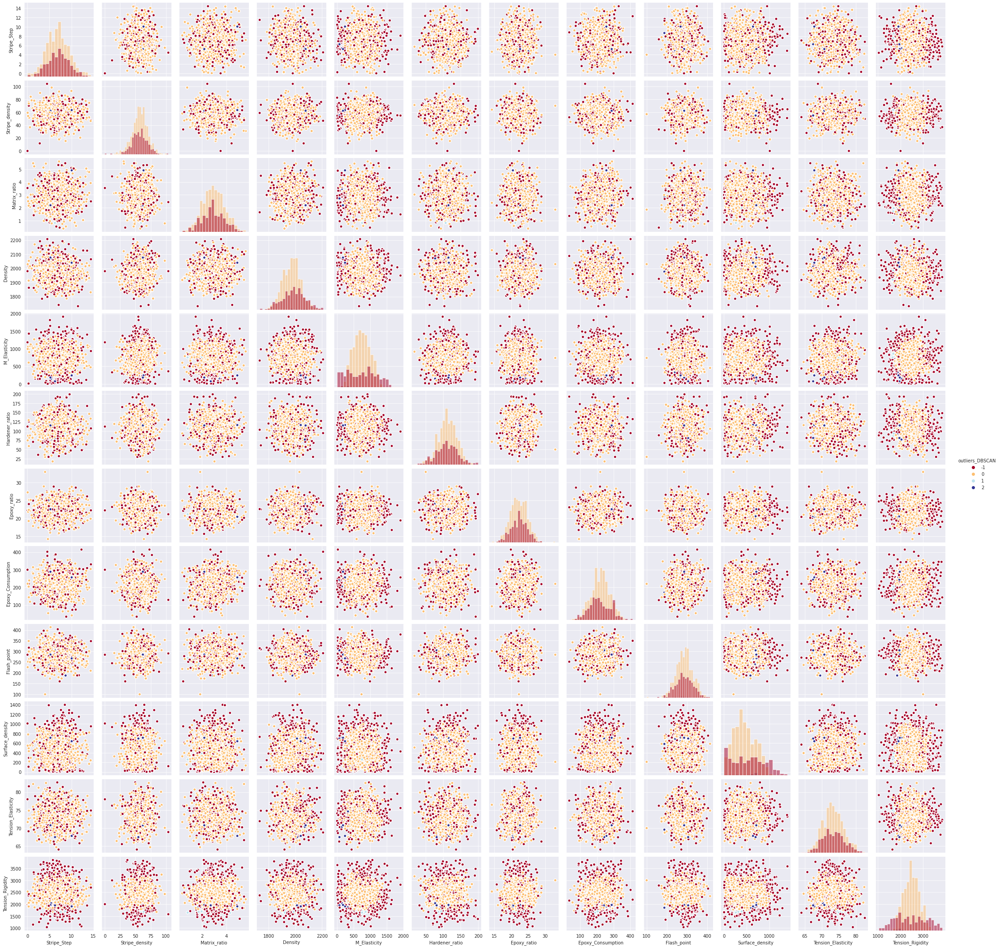

In [16]:
### Визуализируем парный график после кластеризации методом DBSCAN
data = df.drop(columns=['Stripe_angle','outliers_qrtl', 'outliers_clf'])
plt.figure(figsize=(10,8), dpi=80)
sns.pairplot(data, kind="scatter", hue='outliers_DBSCAN', diag_kind='hist', palette='RdYlBu', plot_kws=dict(s=40, edgecolor="white", linewidth=1.5))
plt.show()

Вывод по графикам рассеяния: даже после применения маркировки выбросов основные точки не показывают никаких значимых связей. 

Вывод по гистограммам распределения : распределения признаков имеют форму близкую к нормальной.

## Интелектуальный анализ данных

Ни один из фильтров выбросов не показал нужного эффекта.Данные по прежнему не коррелируются, коэффициент детерминации около нуля. Необходимы дополнительные методы очистки.

> Еще раз посмотрим на качество данных в наборе: - данные до 22 строки включительно контрастируют с данными после 22 строки.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. D

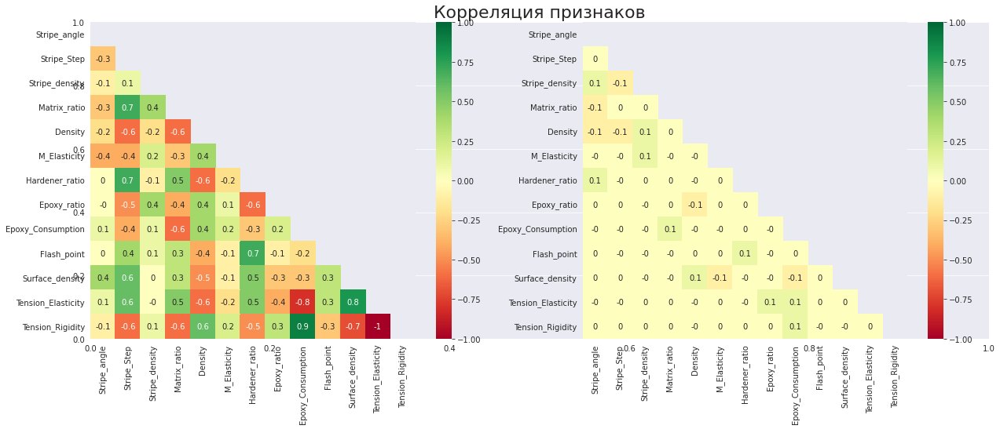

In [21]:
# Проверим корреляцию признаков
data_1 = df_analize.iloc[:22,:][df[filtr_opt]!=-1].corr().round(1)
data_2 = df_analize.iloc[23:,:][df[filtr_opt]!=-1].corr().round(1)
fig = plt.figure(figsize=(18,8))
plt.title('Корреляция признаков', fontsize=22)
fig.add_subplot(121)
mask = np.triu(np.ones_like(data_1, dtype=np.bool)) 
sns.heatmap(data_1, mask= mask, vmin=-1, vmax=1, cmap='RdYlGn', annot=True)

fig.add_subplot(122)
mask = np.triu(np.ones_like(data_2, dtype=np.bool)) 
sns.heatmap(data_2, mask= mask, vmin=-1, vmax=1, cmap='RdYlGn', center=0, annot=True)
plt.tight_layout()
plt.show()

In [22]:
# сравним статистику
stat_1 = df_analize.iloc[:22,:][df[filtr_opt]!=-1].describe().round(1).T
stat_2 = df_analize.iloc[23:,:][df[filtr_opt]!=-1].describe().round(1).T
stat = stat_1.join(stat_2, how='inner', lsuffix='_GOOD', rsuffix='_Noise')
stat

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


,count_GOOD,mean_GOOD,std_GOOD,min_GOOD,25%_GOOD,50%_GOOD,75%_GOOD,max_GOOD,count_Noise,mean_Noise,std_Noise,min_Noise,25%_Noise,50%_Noise,75%_Noise,max_Noise
Stripe_angle,16.0,5.6,22.5,0.0,0.0,0.0,0.0,90.0,667.0,45.7,45.0,0.0,0.0,90.0,90.0,90.0
Stripe_Step,16.0,6.7,2.4,4.0,4.8,6.0,9.0,10.0,667.0,6.9,2.6,0.0,5.1,6.8,8.5,14.4
Stripe_density,16.0,59.8,7.3,47.0,57.0,58.5,62.5,70.0,667.0,57.2,12.4,15.4,50.1,57.6,65.0,98.2
Matrix_ratio,16.0,2.8,1.0,1.6,1.9,2.7,3.6,4.9,667.0,2.9,0.9,0.4,2.3,2.9,3.6,5.6
Density,16.0,1960.6,57.2,1880.0,1910.0,1950.0,2030.0,2030.0,667.0,1971.3,67.0,1786.0,1923.4,1970.8,2014.6,2184.5
M_Elasticity,16.0,668.6,160.4,313.0,538.8,738.7,764.8,889.0,667.0,740.4,256.4,73.8,555.4,734.2,927.7,1372.8
Hardener_ratio,16.0,107.6,33.1,30.0,111.9,120.4,129.0,129.0,667.0,110.8,26.4,17.7,93.3,110.3,129.5,181.8
Epoxy_ratio,16.0,22.5,2.9,21.2,21.2,21.8,22.3,33.0,667.0,22.2,2.4,14.3,20.5,22.1,24.0,29.0
Epoxy_Consumption,16.0,195.0,44.7,120.0,195.0,220.0,220.0,220.0,667.0,219.7,56.6,41.0,184.5,220.7,256.5,356.9
Flash_point,16.0,280.8,48.8,100.0,284.6,292.3,300.0,300.0,667.0,285.8,40.5,173.5,258.8,286.3,312.4,413.3


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


<Figure size 1280x640 with 0 Axes>

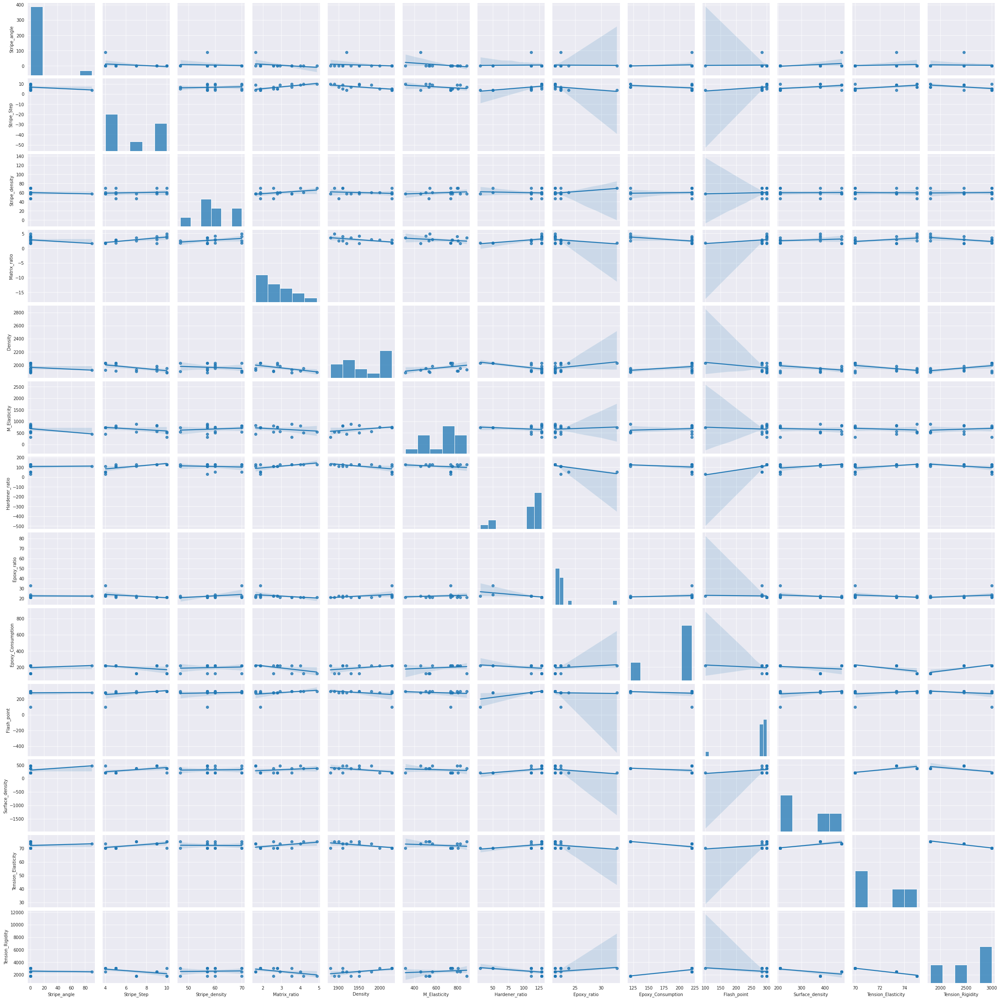

In [ ]:
### Визуализируем парный график
data = df_analize.iloc[:22,:][df[filtr_opt]!=-1]
plt.figure(figsize=(16,8), dpi=80)
sns.pairplot(data, kind="reg", diag_kind='hist', palette='RdYlBu')
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


<Figure size 1280x640 with 0 Axes>

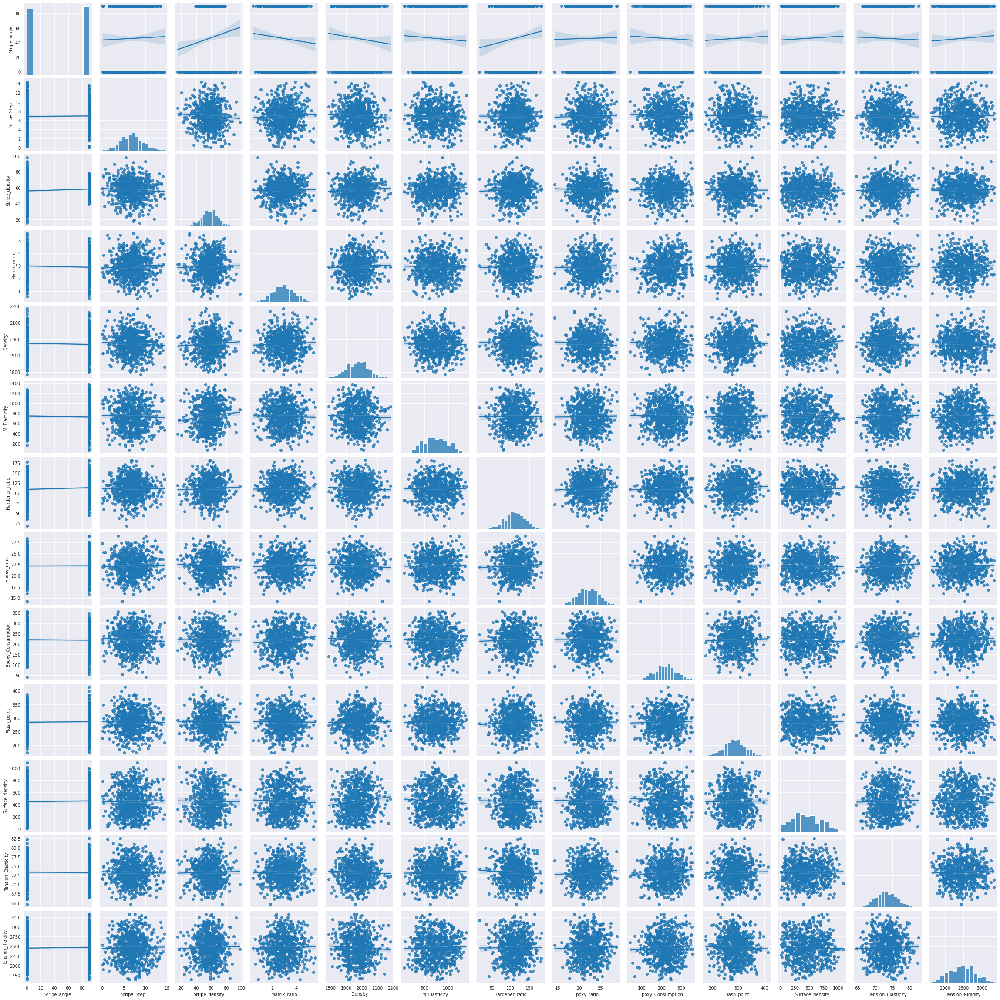

In [19]:
# сравним график рассеяния для подвыборки после 22 строки
data = df_analize.iloc[23:,:][df[filtr_opt]!=-1]
plt.figure(figsize=(16,8), dpi=80)
sns.pairplot(data, kind="reg", diag_kind='hist', palette='Set1')
plt.show()

Как видно из матриц корреляции набор данных до 22 строки имеет корреляцию признаков с целевыми переменными в отличии от набора данных после 22 строки.

  ВЫВОД : Для дальнейшего обучения регрессионных моделей будем использовать первый набор данных.


# Предобработка данных

### Очистка

 Есть несколько вариантов работы с выбросами: 
*   заменить на значение соответствующего квартиля
*   заменить на среднее
*   удалить

Учитывая что в наборе уже есть дублированные данные, то просто удалим строки с аномальными значениями и выбросами. Как было показано в анализе данных, данные ниже 22 строки представляют из себя шум. Поэтому строки ниже 22 строки тоже удалим.



In [23]:
df_clean = df_analize.iloc[:22,:][df[filtr_opt]!=-1].round(2)
df_clean.head()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


,Stripe_angle,Stripe_Step,Stripe_density,Matrix_ratio,Density,M_Elasticity,Hardener_ratio,Epoxy_ratio,Epoxy_Consumption,Flash_point,Surface_density,Tension_Elasticity,Tension_Rigidity
0,0.0,4.0,57.0,1.86,2030.0,738.74,30.00,22.27,220.0,100.00,210.0,70.0,3000.0
1,0.0,4.0,60.0,1.86,2030.0,738.74,50.00,23.75,220.0,284.62,210.0,70.0,3000.0
2,0.0,4.0,70.0,1.86,2030.0,738.74,49.90,33.00,220.0,284.62,210.0,70.0,3000.0
3,0.0,5.0,47.0,1.86,2030.0,738.74,129.00,21.25,220.0,300.00,210.0,70.0,3000.0
4,0.0,5.0,57.0,2.77,2030.0,753.00,111.86,22.27,220.0,284.62,210.0,70.0,3000.0


## Анализ основных компонентов признаков

Анализ главных компонент (PCA) – это статистический метод, который создает новые объекты или признаки путем анализа характеристик набора данных. По существу, характеристики данных суммируются или объединяются вместе.
Анализ основных компонентов выбирает “основные” или наиболее влиятельные признаки и создает на их основе объекты. 


> При выборе только тех объектов, которые оказывают наибольшее влияние на набор данных, размерность уменьшается.В случае контролируемого обучения уменьшение размерности может быть использовано для упрощения функций, подаваемых в классификатор машинного обучения. Это может уменьшить вычислительные требования, связанные с обучением модели, но также помогает бороться с переобучением.

> PCA сохраняет корреляции между переменными при создании новых объектов. Основные компоненты, создаваемые методом, представляют собой линейные комбинации исходных переменных, вычисляемые с помощью понятий, называемых собственными векторами .
Предполагается, что новые компоненты ортогональны или не связаны друг с другом.

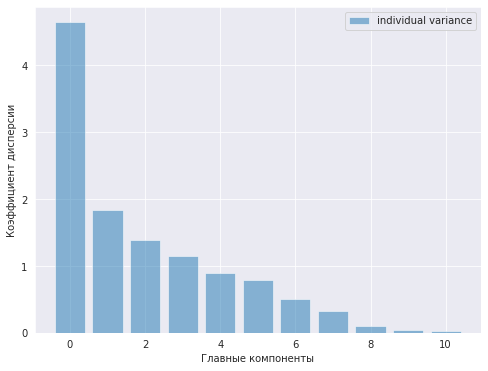

Кол-во компонент описывающих 95% признаков : 6


In [ ]:
# Оценим признаки ПЕРВОЙ подвыборки по значимости методом главных компонент
from sklearn.decomposition import PCA
# визуализация 
data = df_clean.iloc[:,:11]
data_std = StandardScaler().fit_transform(data)
l, n = data_std.shape
pca = PCA()
pca.fit_transform(data_std)
pca_variance = pca.explained_variance_

plt.figure(figsize=(8, 6))
plt.bar(range(n), pca_variance, alpha=0.5, align='center', label='individual variance')
plt.legend()
plt.ylabel('Коэффициент дисперсии')
plt.xlabel('Главные компоненты')
plt.show()
pca_var = pca_variance/sum(pca_variance)*100
N_pca = len(pca_var[pca_var>5])
print('Кол-во компонент описывающих 95% признаков :', N_pca)

Как видно из анализа главных компонент - всего 6 компонент описывают 95% признаков. 

> Вывод : будет полезно применить PCA метод перед подачей данных в модель для обучения.



/usr/local/lib/python3.7/dist-packages/sklearn/base.py:444: UserWarning: X has feature names, but PCA was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"


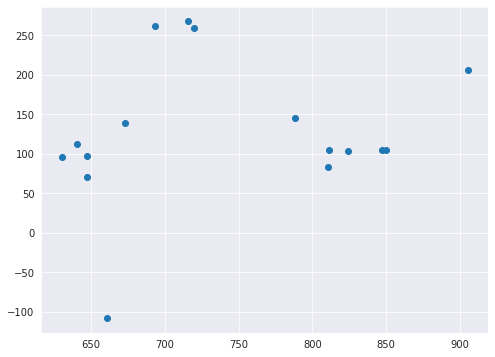

In [ ]:
# Преобразуем эти функции в новый набор лучших признаков отобранных методом PCA
# и построим точечную диаграмму на основе новых признаков
pca2 = PCA(n_components=N_pca)
pca2.fit(data_std)
x_3d = pca2.transform(data)

plt.figure(figsize=(8,6))
plt.scatter(x_3d[:,0], x_3d[:,4])
plt.show()


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.


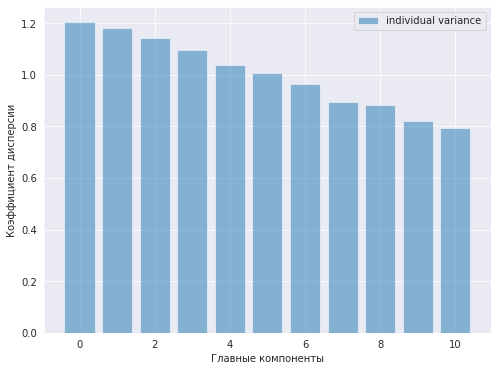

Кол-во компонент описывающих 95% признаков : 11


In [ ]:
# Оценим признаки ВТОРОЙ подвыборки по значимости методом главных компонент
from sklearn.decomposition import PCA
# визуализация 
data = df_analize.iloc[23:,:][df[filtr_opt]!=-1].iloc[:,:11]
data_std = StandardScaler().fit_transform(data)
l, n = data_std.shape
pca = PCA()
pca.fit_transform(data_std)
pca_variance = pca.explained_variance_

plt.figure(figsize=(8, 6))
plt.bar(range(n), pca_variance, alpha=0.5, align='center', label='individual variance')
plt.legend()
plt.ylabel('Коэффициент дисперсии')
plt.xlabel('Главные компоненты')
plt.show()
pca_var = pca_variance/sum(pca_variance)*100
N_pca = len(pca_var[pca_var>5])
print('Кол-во компонент описывающих 95% признаков :', N_pca)

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:444: UserWarning: X has feature names, but PCA was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"


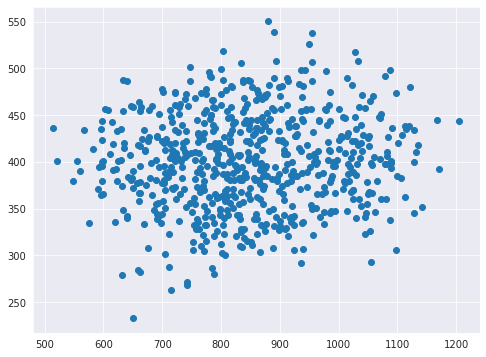

In [ ]:
# Преобразуем эти функции в новый набор лучших признаков отобранных методом PCA
# и построим точечную диаграмму на основе новых признаков
pca3 = PCA(n_components=N_pca)
pca3.fit(data_std)
x_3d = pca3.transform(data)

plt.figure(figsize=(8,6))
plt.scatter(x_3d[:,0], x_3d[:,4],c='green')
plt.show()


## Трансформация данных

Нормализация (normalization) и стандартизация (standardization) являются методами изменения диапазонов значений – шкалирования. Шкалирование особенно полезно в машинном обучении (Machine Learning), поскольку разные атрибуты могут измеряться в разных диапазонах, или значения одного атрибута варьируются слишком сильно. Например, один атрибут имеет диапазон от 0 до 1, а второй — от 1 до 1000. Для задачи регрессии второй атрибут оказывал бы большое влияние на обучение, хотя не факт, что он является более важным, чем первый. Нормализация и стандартизация отличаются своими подходами:

Нормализация подразумевает изменение диапазонов в данных без изменения формы распределения,

Стандартизация изменяет форму распределения данных (приводится к нормальному распределению).

Обычно достаточно нормализовать данные. А вот стандартизацию стоит применять при использование алгоритмов, которые основываются на измерении расстояний, например, k ближайших соседей или метод опорных векторов (SVM). Некоторые  алгоритмы (такие как решающиий Лес) не требуют шкалирования данных.

Так как подход различен, то для каждой модели машинного обучения будет применен свой метод при подаче данных на вход модели для ее обучения.

In [24]:
from sklearn.preprocessing import MinMaxScaler
# нормализация ПЕРВОЙ подвыборки
col = df_clean.columns.to_list()
data_norm = MinMaxScaler().fit(df_clean)
data_norm = data_norm.transform(df_clean)
data_norm = pd.DataFrame(data=data_norm, columns = col)
data_norm.head(3)

,Stripe_angle,Stripe_Step,Stripe_density,Matrix_ratio,Density,M_Elasticity,Hardener_ratio,Epoxy_ratio,Epoxy_Consumption,Flash_point,Surface_density,Tension_Elasticity,Tension_Rigidity
0,0.0,0.0,0.434783,0.078788,1.0,0.739132,0.00000,0.086809,1.0,0.0000,0.0,0.0,1.0
1,0.0,0.0,0.565217,0.078788,1.0,0.739132,0.20202,0.212766,1.0,0.9231,0.0,0.0,1.0
2,0.0,0.0,1.000000,0.078788,1.0,0.739132,0.20101,1.000000,1.0,0.9231,0.0,0.0,1.0


<Figure size 1280x640 with 0 Axes>

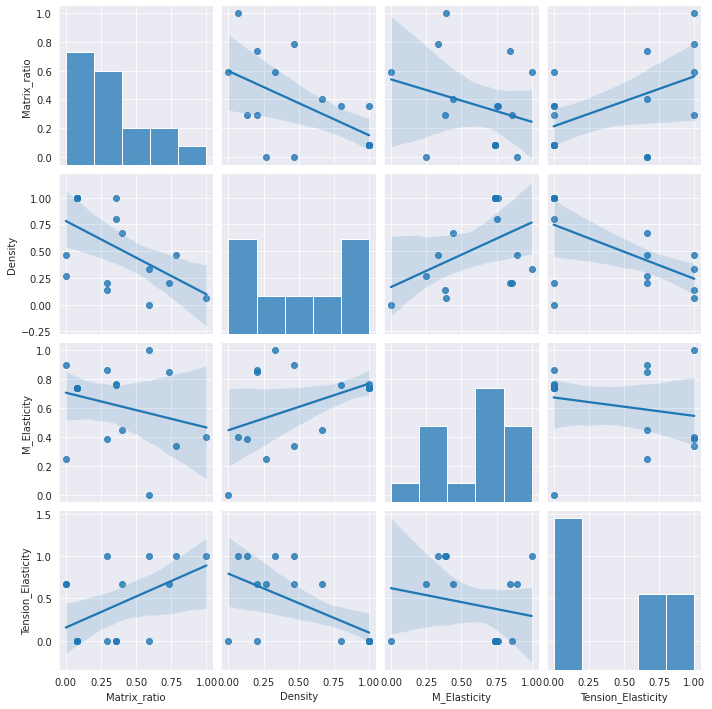

In [ ]:
### Визуализируем распределение ПЕРВОЙ выборки ПОСЛЕ нормализации
data = data_norm
plt.figure(figsize=(16,8), dpi=80)
sns.pairplot(data, kind="reg", diag_kind='hist', vars = ['Matrix_ratio', 'Density', 'M_Elasticity', 'Tension_Elasticity'], palette='RdYlBu')
plt.show()

<Figure size 1280x640 with 0 Axes>

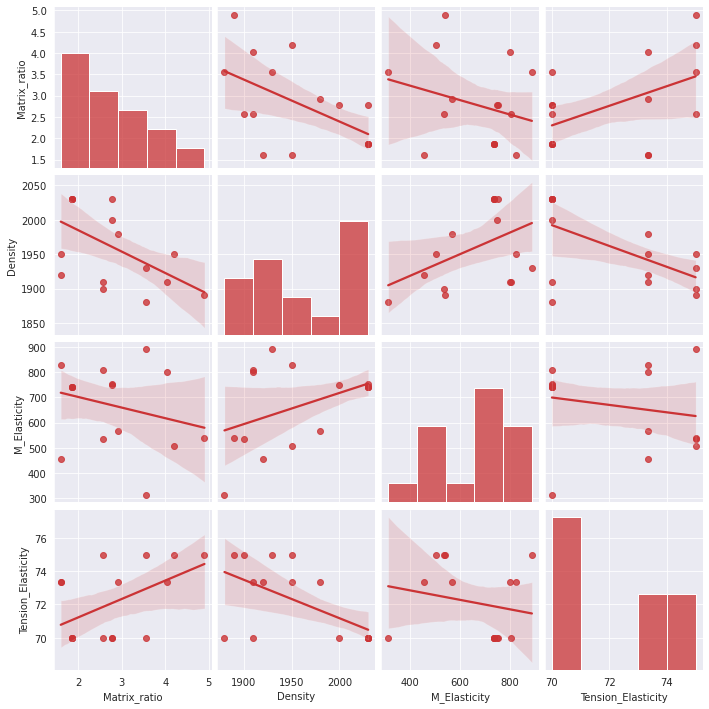

In [ ]:
### для сравнения Визуализируем парный график ПЕРВОЙ выборки ДО нормализации
data = df_clean
sns.set_palette("Set1", 8, .75)
plt.figure(figsize=(16,8), dpi=80)
sns.pairplot(data, kind="reg", diag_kind='hist', vars = ['Matrix_ratio', 'Density', 'M_Elasticity', 'Tension_Elasticity'], palette='Set2')
plt.show()

In [25]:
# статистика ПЕРВОЙ выборки до нормализации
df_clean.describe()[1:].T.style.background_gradient(cmap='Blues', axis=1).format("{:.2f}")

,mean,std,min,25%,50%,75%,max
Stripe_angle,5.62,22.50,0.00,0.00,0.00,0.00,90.00
Stripe_Step,6.69,2.44,4.00,4.75,6.00,9.00,10.00
Stripe_density,59.75,7.26,47.00,57.00,58.50,62.50,70.00
Matrix_ratio,2.78,1.02,1.60,1.86,2.67,3.56,4.90
Density,1960.62,57.21,1880.00,1910.00,1950.00,2030.00,2030.00
M_Elasticity,668.56,160.37,313.00,538.75,738.74,764.75,889.00
Hardener_ratio,107.58,33.09,30.00,111.86,120.43,129.00,129.00
Epoxy_ratio,22.52,2.88,21.25,21.25,21.76,22.27,33.00
Epoxy_Consumption,195.00,44.72,120.00,195.00,220.00,220.00,220.00
Flash_point,280.77,48.81,100.00,284.62,292.31,300.00,300.00


In [26]:
pd.set_option('display.max_colwidth', False)
data_norm.describe().iloc[1:].T.style.background_gradient(cmap='Blues', axis=1).format("{:.2f}")

,mean,std,min,25%,50%,75%,max
Stripe_angle,0.06,0.25,0.00,0.00,0.00,0.00,1.00
Stripe_Step,0.45,0.41,0.00,0.12,0.33,0.83,1.00
Stripe_density,0.55,0.32,0.00,0.43,0.50,0.67,1.00
Matrix_ratio,0.36,0.31,0.00,0.08,0.32,0.59,1.00
Density,0.54,0.38,0.00,0.20,0.47,1.00,1.00
M_Elasticity,0.62,0.28,0.00,0.39,0.74,0.78,1.00
Hardener_ratio,0.78,0.33,0.00,0.83,0.91,1.00,1.00
Epoxy_ratio,0.11,0.25,0.00,0.00,0.04,0.09,1.00
Epoxy_Consumption,0.75,0.45,0.00,0.75,1.00,1.00,1.00
Flash_point,0.90,0.24,0.00,0.92,0.96,1.00,1.00


# Подбор модели машинного обучения

Возьмем следующие модели для машинного обучения
*   регрессию (метод наименьших квадратов)
*   Случайный лес
*   Метод Ближайших соседей
*   Метод опорных векторов с линейным ядром
*   Логистическая регрессия




In [27]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from sklearn.preprocessing import LabelEncoder
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import cross_val_score

## Регрессия Лассо

Регрессия чуствительна к качеству выборки, особенно на маленькой выборке, поэтому используем регрессию с регуляризацией.

    Гребневая регрессия лучше подходит в ситуации, когда мы хотим сделать приоритетными большое количество переменных, каждая из которых имеет небольшой эффект. Если в модели требуется учитывать несколько переменных, каждая из которых имеет средний или большой эффект, лучшим выбором будет лассо. 
    Для текущей задачи оптимальней использовать регрессию Лассо. 

    Подготовим параметры для регрессии Лассо на выбранных данных: настроим коэффициент Альфа и определим степень полинома.

Альфа Tension_Elasticity: 0.00
Альфа Tension_Rigidity: 0.19


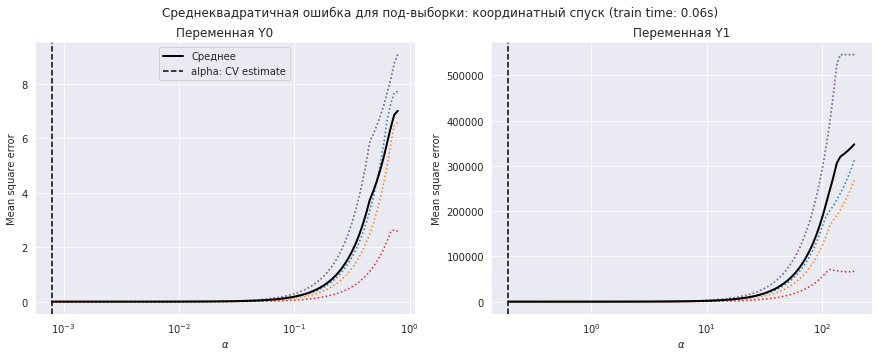

In [28]:
#Выбор коэф. АЛЬФА для Регрессии Лассо с помощью перекрестной проверки

Y_n = ['Tension_Elasticity', 'Tension_Rigidity'] # обозначим целевые переменные
data = df_clean.iloc[:,:11] # выделим признаки
lasso_nalpha = []

fig, ax = plt.subplots(1,2, figsize=(15,5))
for i, Y in enumerate(Y_n):
  target_func = df_clean[Y] # выделим целевые переменные

  start_time = time.time()
  model = make_pipeline(MinMaxScaler(), LassoCV(cv=5, max_iter=5000)).fit(data, target_func)
  fit_time = time.time() - start_time

  lasso = model[-1]
  ax[i].set_title(f'Переменная Y{i}')
  ax[i].semilogx(lasso.alphas_, lasso.mse_path_, linestyle=":")
  ax[i].plot(
      lasso.alphas_,
      lasso.mse_path_.mean(axis=-1),
      color="black",
      label="Среднее",
      linewidth=2,
  )
  ax[i].axvline(lasso.alpha_, linestyle="--", color="black", label="alpha: CV estimate")
  ax[i].set_xlabel(r"$\alpha$")
  ax[i].set_ylabel("Mean square error")
  ax[0].legend()
  fig.suptitle(
      f"Среднеквадратичная ошибка для под-выборки: координатный спуск (train time: {fit_time:.2f}s)"
  )
  #plt.ylim(ymin, ymax)
  print(f'Альфа {Y}: {lasso.alpha_:.2f}')
  lasso_nalpha.append(int(-1 * lasso.alpha_ // 1 * -1))

In [29]:
# Настроим параметры полиноминальной регрессии. Определим ее степень.

lasso_eps = 0.001 # шаг
lasso_iter=10000 #макс кол-во циклов

Y_n = ['Tension_Elasticity', 'Tension_Rigidity'] # обозначим целевые переменные
data = df_clean.iloc[:,:11] # выделим признаки
# подготовим таблицу для вывода результатов
res_degree = pd.DataFrame({'Y_function':[], 'polinom_degree':[], 'Score_r2':[], 'RMSE':[]})

for Y, A in zip(Y_n, lasso_nalpha):
  target_func = df_clean[Y].values
  X_train, X_test, y_train, y_test = train_test_split(data, target_func,test_size=0.2)
  degree = 1 # начальная степень полинома
  test_score = 0
  while test_score <1 and test_score >=0 and degree<5:
    # соберем "конвейер" с полиноминальной трансформацией и LASSO регрессией с кросс-валидацией
    model_lasso = make_pipeline(MinMaxScaler(), 
                          PolynomialFeatures(degree, interaction_only=False), 
                          LassoCV(eps=lasso_eps, n_alphas=A, max_iter=lasso_iter, cv=5)) 
    model_lasso.fit(X_train,y_train) 
    test_pred = np.array(model_lasso.predict(X_test))
    RMSE=np.sqrt(np.sum(np.square(test_pred-y_test))) 
    test_score = model_lasso.score(X_test,y_test)
    # запишем полученные значения
    res_degree.loc[len(res_degree)] = [Y,degree,test_score,RMSE]
    degree += 1
# оптимальная степень полинома   
degree_opt = int(res_degree['polinom_degree'][res_degree['Score_r2'].idxmax()])
print('оптимальная степень полиноминальной регрессии: ', degree_opt)
res_degree

оптимальная степень полиноминальной регрессии:  4


,Y_function,polinom_degree,Score_r2,RMSE
0,Tension_Elasticity,1.0,0.999999,0.004489
1,Tension_Elasticity,2.0,0.999999,0.004488
2,Tension_Elasticity,3.0,0.999999,0.004488
3,Tension_Elasticity,4.0,0.999999,0.004488
4,Tension_Rigidity,1.0,0.999991,1.385328
5,Tension_Rigidity,2.0,0.999960,2.974035
6,Tension_Rigidity,3.0,0.999889,4.976926
7,Tension_Rigidity,4.0,0.999775,7.065615


## Регрессия дерева решений

Деревья решений в классификации и регрессии очень похожи, поскольку работают путем построения деревьев с узлами «да/нет». Однако в то время как конечные узлы классификации приводят к одному значению класса (например, 1 или 0 для задачи бинарной классификации), деревья регрессии заканчиваются значением в непрерывном режиме (например, 4593,49 или 10,98). Регрессия дерева решений не требует шкалирования данных на входе, так как при этом могут теряться некоторые свойства признаков. Кроме того деревья решений могут принимать несколько целевых функций. Все перечисленное делает деревья универсальным инструментом.

In [30]:
# зададим признаки и целевые функции
labels = df_clean[['Tension_Elasticity', 'Tension_Rigidity']]
features = df_clean.drop(columns=['Tension_Elasticity', 'Tension_Rigidity'])
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.3)

In [31]:
from sklearn.model_selection import RandomizedSearchCV
 
# Кол-во деревьев в лесу
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# кол-во признаков в каждом узле
max_features = ['auto', 'sqrt']
# максимальное кол-во уровней в дереве
max_depth = [int(x) for x in np.linspace(10, 100, num = 10)]
max_depth.append(None)
# минимальное кол-во экземпляров для разделения в узле
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# метод отбора экземпляров для обуч. и тренир. выборок
bootstrap = [True]
 
# создание сетки
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
 
 
# используем поиск по сетке для подбоора гиперпараметров
# задаим базовую модель для старта тюнинга
rf = RandomForestRegressor()
# на вход подаем заданные параметры, разбивка на 3 пакета кросс-валидации, 
# поиск около 100 различных комбинаций 100
rf_random = RandomizedSearchCV(estimator=rf, param_distributions=random_grid,
                              n_iter = 100, scoring='neg_mean_absolute_error', 
                              cv = 3, verbose=2, random_state=42, n_jobs=-1)
 
# заполним модель
rf_random.fit(features, labels)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestRegressor(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'bootstrap': [True],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800, 2000]},
                   random_state=42, scoring='neg_mean_absolute_error',
                   verbose=2)

In [ ]:
rf_random.best_params_

In [32]:
def evaluate(model, test_features, test_labels):
    predictions = model.predict(test_features)
    errors = abs(predictions - test_labels)
    cv_scores = cross_val_score(model, test_features, test_labels,
                                cv=4, scoring='r2')
    print('Эффективность модели')
    print('Средняя ошибка: degrees.\n', np.mean(errors).round(2))
    print('R^2 =', np.mean(cv_scores).round(2))

In [33]:
best_random = rf_random.best_estimator_
evaluate(best_random, features, labels)

Эффективность модели
Средняя ошибка: degrees.
 Tension_Elasticity    0.14 
Tension_Rigidity      29.75
dtype: float64
R^2 = 0.42


In [34]:
# выполним следующий шаг для тонкой настройки гиперпараметров дерева
from sklearn.model_selection import GridSearchCV
 
# зададим сетку параметров, базируясь на результатах предыдущейподгонки 
param_grid = {
    'bootstrap': [True],
    'max_depth': [20, 30, 40, 50],
    'max_features': ['auto'],
    'min_samples_leaf': [1, 2, 3],
    'min_samples_split': [1, 2, 5],
    'n_estimators': [1200, 1400, 1600, 1800]
}
 
# Зададим базовую модель
rf = RandomForestRegressor()
 
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                           scoring = 'neg_mean_absolute_error', cv = 3, 
                           n_jobs = -1, verbose = 2)
 
# Fit the grid search to the data
grid_search.fit(features, labels)

Fitting 3 folds for each of 144 candidates, totalling 432 fits


/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning: 
144 fits failed out of a total of 432.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
144 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py", line 467, in fit
    for i, t in enumerate(trees)
  File "/usr/local/lib/python3.7/dist-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/usr/local/lib/python3.7/dist-packages/joblib/p

GridSearchCV(cv=3, estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid={'bootstrap': [True], 'max_depth': [20, 30, 40, 50],
                         'max_features': ['auto'],
                         'min_samples_leaf': [1, 2, 3],
                         'min_samples_split': [1, 2, 5],
                         'n_estimators': [1200, 1400, 1600, 1800]},
             scoring='neg_mean_absolute_error', verbose=2)

In [35]:
bp = grid_search.best_params_
bp

{'bootstrap': True,
 'max_depth': 30,
 'max_features': 'auto',
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 1600}

In [36]:
best_RandomForest = grid_search.best_estimator_
evaluate(best_RandomForest, features, labels)

Эффективность модели
Средняя ошибка: degrees.
 Tension_Elasticity    0.14 
Tension_Rigidity      28.35
dtype: float64
R^2 = 0.41


## Метод Ближайших соседей

Принцип, лежащий в основе методов ближайшего соседа, состоит в том, чтобы найти предопределенное количество обучающих выборок, ближайших по расстоянию к новой точке, и предсказать метку по ним. Количество выборок может быть заданной пользователем константой (обучение k-ближайшего соседа) или изменяться в зависимости от локальной плотности точек (обучение соседей на основе радиуса). Расстояние, как правило, может быть любой метрической мерой: стандартное евклидово расстояние является наиболее распространенным выбором.

Так как в основе алгоритма расчет расстояий, то понадобится стандартизация данных на входе.

In [161]:
# выполним настройкe гиперпараметров метода соседей
from sklearn.model_selection import GridSearchCV
 
# зададим сетку параметров
param_grid = {
    'n_neighbors': [2,3,4,5,6,7,8,9],
    'weights': ['uniform','distance'],
    'algorithm': ['auto','ball_tree', 'kd_tree'],
    'leaf_size': [1, 2, 5],
    'p': [1, 2]
}
 
# Зададим базовую модель
KN = KNeighborsRegressor()
 
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = KN, param_grid = param_grid, 
                           scoring = 'neg_mean_squared_error', cv = 5, 
                           n_jobs = -1, verbose = 2)
model_KN = make_pipeline(StandardScaler(), grid_search)
 
# Fit the grid search to the data
grid_search.fit(features, labels.iloc[:,1])

Fitting 5 folds for each of 288 candidates, totalling 1440 fits


GridSearchCV(cv=5, estimator=KNeighborsRegressor(), n_jobs=-1,
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree'],
                         'leaf_size': [1, 2, 5],
                         'n_neighbors': [2, 3, 4, 5, 6, 7, 8, 9], 'p': [1, 2],
                         'weights': ['uniform', 'distance']},
             scoring='neg_mean_squared_error', verbose=2)

In [162]:
bp_KN = grid_search.best_params_
bp_KN

{'algorithm': 'auto',
 'leaf_size': 1,
 'n_neighbors': 5,
 'p': 1,
 'weights': 'distance'}

In [163]:
best_Kneighbours = grid_search.best_estimator_
evaluate(best_Kneighbours, features, labels.iloc[:,1])

Эффективность модели
Средняя ошибка: degrees.
 0.0
R^2 = 0.25


## Метод опорных векторов

In [164]:
# выполним настройкe гиперпараметров Опорных векторов
from sklearn.model_selection import GridSearchCV
 
# зададим сетку параметров
param_grid = {
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    'degree': [1,2,3],
    'gamma': ['scale','auto']
}
 
# Зададим базовую модель
svr = SVR()
 
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = svr, param_grid = param_grid, 
                           scoring = 'neg_mean_squared_error', cv = 5, 
                           n_jobs = -1, verbose = 2)
model_SVR = make_pipeline(MinMaxScaler(), grid_search)
 
# Fit the grid search to the data
grid_search.fit(features, labels.iloc[:,0])

Fitting 5 folds for each of 24 candidates, totalling 120 fits


GridSearchCV(cv=5, estimator=SVR(), n_jobs=-1,
             param_grid={'degree': [1, 2, 3], 'gamma': ['scale', 'auto'],
                         'kernel': ['linear', 'poly', 'rbf', 'sigmoid']},
             scoring='neg_mean_squared_error', verbose=2)

In [165]:
bp_svr = grid_search.best_params_
bp_svr

{'degree': 1, 'gamma': 'scale', 'kernel': 'linear'}

In [166]:
best_svr = grid_search.best_estimator_
evaluate(best_svr, features, labels.iloc[:,0])

Эффективность модели
Средняя ошибка: degrees.
 0.1
R^2 = 0.52


## Логистическая регрессия

Логистическая регрессия в общем случае является методом классификации. Но ее можно применить в качестве регрессора, закодировав целевую переменную.

## Сравнение регрессиионных моделей

Подготовим конвейер из различных регрессионных моделей, оценим результат моделирования с помощью метрики R^2 score и запишем данные в таблицу для сравнения.

In [167]:
# готовим выборку
data = df_clean.iloc[:,:11]
Y_n = ['Tension_Elasticity', 'Tension_Rigidity'] # обозначим целевые переменные
#создаем временные структуры
names_models = ['Lasso_CV', 'RandomForest', 'KNeighbors', 'SVR', 'LogRegr']
TestModels = pd.DataFrame(columns=Y_n, index=names_models)
tmp = {}

# для кажой целевой переменной
for Y, A in zip(Y_n, lasso_nalpha):
	# соберем модели для целевой переменной Y
	Lasso_CV = make_pipeline(MinMaxScaler(), PolynomialFeatures(degree_opt, interaction_only=True),
                        LassoCV(n_alphas=A, max_iter=lasso_iter, cv=4),)
	preproces = make_column_transformer( 
			(StandardScaler(), data.columns),)
	LogRegr = make_pipeline(preproces, LogisticRegression())

	models = [Lasso_CV, best_RandomForest,
						best_Kneighbours, best_svr, LogRegr]

	# подготовим выборку для данной целевой переменной
	tgt_func = df_clean[Y]

	# для каждой модели из списка
	for model, name_model in zip(models, names_models):
		#обучаем модель
		if model == LogRegr:
			tgt_func_LE = LabelEncoder().fit_transform(tgt_func) #
			model.fit(data, tgt_func_LE)#
			cv_scores = cross_val_score(model, data, tgt_func_LE, 
															cv=4, scoring='r2')
		else:
			model.fit(data, tgt_func)
			cv_scores = cross_val_score(model, data, tgt_func, 
															cv=4, scoring='r2')
		#вычисляем коэффициент детерминации
		TestModels.loc[name_model][Y] = np.mean(cv_scores)

In [168]:
TestModels.style.background_gradient(cmap='Green', axis=1).format("{:.2f}")

,Tension_Elasticity,Tension_Rigidity
Lasso_CV,0.75,0.75
RandomForest,0.50,0.59
KNeighbors,-1.23,0.25
SVR,0.52,0.59
LogRegr,0.64,0.64


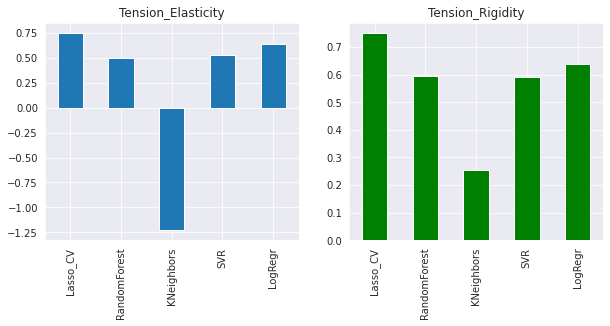

In [169]:
fig, axes = plt.subplots(ncols=2, figsize=(10,4))
TestModels[Y_n[0]].plot(ax=axes[0], kind='bar', title=Y_n[0])
TestModels[Y_n[1]].plot(ax=axes[1], kind='bar', color='green', title=Y_n[1])

Анализ результатов и выводы:

Из графиков, приведенных выше, можно сделать вывод, что лучше других с задачей справился метод Полиноминальная регрессия Лассо. Его коэффициенты детерминации выше остальных по обоим переменным. 
Для дальнейшего Использования заново обучим выбранную модель на полной выборке.

## Обучение выбранной модели

Выполним обучение и предсказание.

In [187]:
# готовим выборку
data = MinMaxScaler().fit_transform(df_clean.iloc[:,:11])
Y_n = ['Tension_Elasticity', 'Tension_Rigidity'] # обозначим целевые переменны
Regressor = []
# для кажой целевой переменной
v=1
for Y, A in zip(Y_n, lasso_nalpha):
	# соберем моделm для целевой переменной Y
	Lasso_CV = make_pipeline(PolynomialFeatures(degree_opt, interaction_only=True),
                        LassoCV(n_alphas=A, max_iter=lasso_iter, cv=4),)

	# подготовим выборку для целевой переменной Y
	tgt_func = df_clean[Y]
	Lasso_CV.fit(data, tgt_func)
	cv_scores = cross_val_score(Lasso_CV, data, tgt_func,
	                            cv=4, scoring='r2')#
	Regressor.append(Lasso_CV)
	
	#вычисляем коэффициент детерминации
	print(Y, ' ', np.mean(cv_scores).round(2))

Tension_Elasticity   0.75
Tension_Rigidity   0.75


In [190]:
Regr_Elasticity = Regressor[0]
Regr_Rigidity = Regressor[1]

In [194]:
Regr_Rigidity.predict(data).round()

array([2999., 2999., 2999., 2999., 2999., 2999., 2999., 1801., 1801.,
       2456., 2456., 2456., 2999., 1801., 1801., 2456.])

# Нейронная сеть для рекомендациии

В данной задаче требууется написать нейронную сеть, которая будет рекомендовать соотношение матрица-наполнитель. Для ее выполнения разделим данные на признаки и целевые переменные. В качестве целевоой переменной берем 'Matrix_ratio'.

In [ ]:
# импортируем библиотеки для построения нейросети
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, ReLU, BatchNormalization
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras import backend
from sklearn.model_selection import KFold, StratifiedKFold

In [ ]:
# определим функцию для отрисовки истории обучения
def plot_loss (history):
    plt.plot(history.history['loss'], label='loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.ylim([0,10])
    plt.xlabel('Эпохи обучения')
    plt.ylabel('Ошибка')
    plt.legend()
    plt.grid(True)

In [ ]:
plot_loss(history)

In [ ]:
# Делаем прогноз. Возвращается копия предсказания в виде одномерного массива
pred = model.predict(X_test).flatten() 
# Возвращаем к прежнему размеру
#pred = pred * max(y_test) + min(y_test) 
#y_test = y_test * max_y + min_y

Предсказание представляет резуультат среднего. Это говорит о том что выборка (подавляющая ее часть представляет изз себя шум распределенный по нормальному закону). Обучим модель на части выборки выявленной ранее как незашумленные данные (первые 22 строки с фильтрацией выбросов). Так как размер выборки очень мал для эффективного обучения нейронной cети, то искусственно увеличим выборку методом Бутстрэп.

In [ ]:
df_clean_expand = df_clean.sample(n = 200, replace=True, random_state=0)
print('новая увеличенная выборка размером ', df_clean_expand.shape)

новая увеличенная выборка размером  (200, 13)


При исскуственном увеличении выборки, после ее разбиения на тестовую и тренировочную, некоторое количество строк продублируется между ними, что может привести к переобучению. Для компенсации этого применим метод K-Folds кросс-валидация. Он создает процесс, в котором каждый образец данных будет включен в набор тестов на некоторых этапах.

In [ ]:
# создание экземпляров K-fold
kf = KFold(n_splits = 5, random_state = 7, shuffle = True)

# Вспомогательная функция для получения имени модели в каждой из k итераций
def get_model_name(k):
    return 'model_'+str(k)+'.h5'

# функция построения модели нейросети
def build_and_compil_model(m=None): # в модель подается количество признаков
    model = Sequential([
        BatchNormalization(axis=1, input_dim=m),
        Dense(100, activation='relu'), #скрыттые слои
        Dense(50, activation='relu'),
        Dense(25, activation='softmax'),
        Dense(1, activation='linear')]) # выходной слой, один нейрон, так как регрессия для одной искомой величины
    
    model.compile(optimizer='rmsprop', loss='mse', metrics=['mae'])
    return model

In [ ]:
# получение подвыборок
data = df_clean_expand.drop(columns= 'Matrix_ratio')
tgt_func = df_clean_expand['Matrix_ratio']
n, m = data.shape
VALIDATION_MAE = []
VALIDAITON_LOSS = []
VALIDATION_r2 = []

save_dir = '/saved_models/'
fold_var = 1

for train_index, val_index in kf.split(data, tgt_func):
  X_train = data.iloc[train_index]
  y_train = tgt_func.iloc[train_index]
  X_test = data.iloc[val_index]
  y_test = tgt_func.iloc[val_index]
  # инициация и компилиррование новой модели
  model = build_and_compil_model(m)	
	# создать точку CALLBACKS
  checkpoint = ModelCheckpoint(save_dir+get_model_name(fold_var),
                              monitor='val_mae', verbose=0,
                              save_best_only=True, mode='max')
  callbacks_list = [checkpoint]
	# Могут быть и другие обратные вызовы, но показывается только один, потому что он включает имя модели
	# Это позволяет сохранить лучшую модель
	# Обучить модель
  history = model.fit(X_train, y_train,
                     epochs=200, callbacks=callbacks_list,
                     validation_data=(X_test,y_test), verbose=0)

	# ЗАГРУЗКА ЛУЧШЕЙ МОДЕЛИ для оценки производительности модели
  model.load_weights("/saved_models/model_"+str(fold_var)+".h5")
  
  results = model.evaluate(X_test, y_test)
  results = dict(zip(model.metrics_names,results))
  
  VALIDATION_MAE.append(results['mae'])
  VALIDAITON_LOSS.append(results['loss'])
  
  backend.clear_session()
  
  fold_var += 1

2/2 [==============================] - 0s 6ms/step - loss: 5.4373 - mae: 2.1241


In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization (BatchN  (None, 12)               48        
 ormalization)                                                   
                                                                 
 dense (Dense)               (None, 100)               1300      
                                                                 
 dense_1 (Dense)             (None, 50)                5050      
                                                                 
 dense_2 (Dense)             (None, 25)                1275      
                                                                 
 dense_3 (Dense)             (None, 1)                 26        
                                                                 
Total params: 7,699
Trainable params: 7,675
Non-trainable params: 24
_____________________________________________________

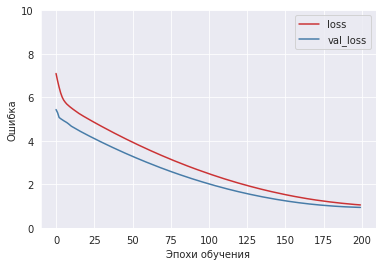

In [ ]:
plot_loss(history)

#### R^2 score
r2_scr = r2_score(tgt_func, pred)
r2_scr

In [ ]:
# Средний модуль отклонения 
err = round(np.mean(abs(pred - y_test)),2)
print(err)

# Сохранение модели

!pip uninstall scikit-learn
!pip install scikit-learn==0.22.1

!pip uninstall sklearn_porter
!pip install sklearn_porter

In [223]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import RandomForestClassifier
import pickle

In [ ]:
from sklearn_porter import Porter

In [225]:
pickle.dump(Regr_Elasticity, open('rgr_mod_1.pkl', 'wb'))
pickle.dump(Regr_Rigidity, open('rgr_mod_2.pkl', 'wb'))

# Мусор на удаление

model = models[4] 
enc = LabelEncoder().fit(tgt_func) # закодируем целевую переменную
tgt_func_LE = enc.transform(tgt_func)
model.fit(data, tgt_func_LE)
pred_LE = model.predict(data) # сделаем предсказание
predict = enc.inverse_transform(pred_LE) # раскодируем предсказание
LogReg_score = r2_score(tgt_func, predict) # оценим результат
LogReg_score

for i in df.iloc[:,1:].columns:
  k = df[i][df[i].duplicated()].value_counts()
  print('_____________________________________')
  print(k)

заменим повторы на NaN
df_purge = df.drop(columns=outl_filtres)
for i in df_purge.iloc[:,1:].columns:
  df_purge[i][df_purge[i].duplicated()] = np.nan

смотрим расположение пропусков в данных
желтый - пропущенные данные, синий - не пропущенные
plt.figure(figsize=(12,6))
colours = ['#000099', '#ffff00'] 
sns.heatmap(df_purge.isnull(), cmap=sns.color_palette(colours))

Так как удаленные значения преимущественно cосредоточены в одних и тех же строках, то удалим эти строки. И еще раз оценим корреляцию.

df_purge = df_purge[df[filtr_opt] !=-1]
df_purge=df_purge.dropna()
#### Проверим корреляцию признаков
plt.figure(figsize=(12,8), dpi= 80)
sns.heatmap(df_purge.corr(), xticklabels=df_purge.corr().columns, yticklabels=df_purge.corr().columns, cmap='RdYlGn', center=0, annot=True)
plt.title('Корреляция признаков', fontsize=22)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

data_matrix = df.iloc[:,:13][df[filtr_opt]!=-1].drop(columns='Matrix_ratio')
tgt_matrix = df['Matrix_ratio'][df[filtr_opt]!=-1]
X_train, X_test, y_train, y_test = train_test_split(data_matrix, tgt_matrix, test_size=0.3)
n, m = data_matrix.shape

#### соберем модель сети для регрессии
NN_regr = Sequential()
NN_regr.add(BatchNormalization(axis=1, input_dim=m))
NN_regr.add(Dense(100, activation='relu'))
NN_regr.add(Dense(50, activation='relu'))
NN_regr.add(Dense(25, activation='softmax'))

#### выходящий слой для регрессии
NN_regr.add(Dense(1, activation='linear'))
NN_regr.summary()

#### Делаем прогноз. Возвращается копия предсказания в виде одномерного массива
model.load_weights("/saved_models/model_"+str(fold_var)+".h5")
pred = model.predict(data).flatten() 
#### Возвращаем к прежнему размеру
####pred = pred ** np.std(y_test) + min(y_test) 
####y_test = y_test * max_y + min_y


####  компилируем сеть
model.compile(optimizer='rmsprop', loss='mse', metrics=['mae'])

#### обучаем сеть
history = model.fit(X_train, 
                    y_train, 
                    epochs=100, 
                    validation_split=0.1, 
                    verbose=0)